# Disco Diffusion

```{note}
Install ekorpkit package first.

Set logging level to Warning, if you don't want to see verbose logging.

If you run this notebook in Colab, set Hardware accelerator to GPU.
```

```{toggle}
%%capture
!pip install ekorpkit[disco]
exit()
```

In [1]:
from ekorpkit import eKonf

eKonf.setLogger("INFO")
print("version:", eKonf.__version__)

is_notebook = eKonf.is_notebook()
is_colab = eKonf.is_colab()
print("is notebook?", is_notebook)
print("is colab?", is_colab)
if is_colab:
    from google.colab import drive
    drive.mount('/content/drive')

    eKonf.env_set("EKORPKIT_PROJECT", "disco-imagen")
    eKonf.env_set("EKORPKIT_WORKSPACE_ROOT", "/content/drive/MyDrive/colab_workspace")

eKonf.env_set('KMP_DUPLICATE_LIB_OK', 'TRUE')

print("evironment varialbles:")
eKonf.print(eKonf.env().dict())

INFO:ekorpkit.base:IPython version: (6, 9, 0), client: jupyter_client
INFO:ekorpkit.base:Google Colab not detected.


version: 0.1.34+8.g7cf69c1.dirty
is notebook? True
is colab? False
evironment varialbles:
{'EKORPKIT_CONFIG_DIR': '/workspace/projects/ekorpkit-book/config',
 'EKORPKIT_DATA_DIR': None,
 'EKORPKIT_LOG_LEVEL': None,
 'EKORPKIT_PROJECT': 'ekorpkit-book',
 'EKORPKIT_WORKSPACE_ROOT': '/workspace',
 'NUM_WORKERS': 230}


In [2]:
cfg = eKonf.compose("model/disco")
cfg.diffuse.n_batches = 4
disco = eKonf.instantiate(cfg)

INFO:ekorpkit.base:IPython version: (6, 9, 0), client: jupyter_client
INFO:ekorpkit.base:IPython version: (6, 9, 0), client: jupyter_client
INFO:ekorpkit.base:Google Colab not detected.
INFO:ekorpkit.models.disco.base:> downloading models...
INFO:ekorpkit.models.disco.base:Downloading model model_256 from {'SHA': '983e3de6f95c88c81b2ca7ebb2c217933be1973b1ff058776b970f901584613a', 'filename': '256x256_diffusion_uncond.pt', 'link': 'https://openaipublic.blob.core.windows.net/diffusion/jul-2021/256x256_diffusion_uncond.pt', 'link_fb': 'https://www.dropbox.com/s/9tqnqo930mpnpcn/256x256_diffusion_uncond.pt', 'archive_path': '/workspace/data/archive/disco-imagen/models/256x256_diffusion_uncond.pt', 'path': '/workspace/projects/ekorpkit-book/disco-imagen/models/256x256_diffusion_uncond.pt'}
INFO:ekorpkit.models.disco.utils:Model model_256 already downloaded, set check_model_SHA to true if the file is corrupt
INFO:ekorpkit.models.disco.base:Downloading model model_512 from {'SHA': '9c111ab89e2

INFO:ekorpkit.utils.lib:utils not imported, loading from /workspace/projects/ekorpkit-book/disco-imagen/libs/MiDaS as midas_utils
INFO:ekorpkit.utils.lib:infer not imported, loading from /workspace/projects/ekorpkit-book/disco-imagen/libs/AdaBins as infer
INFO:ekorpkit.utils.lib:utils.flow_viz not imported, loading from /workspace/projects/ekorpkit-book/disco-imagen/libs/RAFT/core as flow_viz
INFO:ekorpkit.utils.lib:utils.utils not imported, loading from /workspace/projects/ekorpkit-book/disco-imagen/libs/RAFT/core as utils.utils
INFO:ekorpkit.utils.lib:raft imported
INFO:ekorpkit.models.disco.base:> loading diffusion models...
INFO:ekorpkit.models.disco.base:Using device:cuda:0
INFO:ekorpkit.models.disco.base:Disabling CUDNN for A100 gpu
INFO:ekorpkit.models.disco.base:> loading clip models...


Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: /opt/conda/lib/python3.8/site-packages/lpips/weights/v0.1/vgg.pth


In [3]:
text_prompts = "Members of the Federal Reserve Board are convened to cut the target interest rates, surrounding by doves, in a large tower."
text_prompts = 'At a special meeting, hawkish central bankers are poised to raise the target rates, Trending on artstation.'

Batches:   0%|          | 0/4 [00:00<?, ?it/s]

Output()

  0%|          | 0/240 [00:00<?, ?it/s]

INFO:ekorpkit.models.disco.base:Seed used: 2184013122


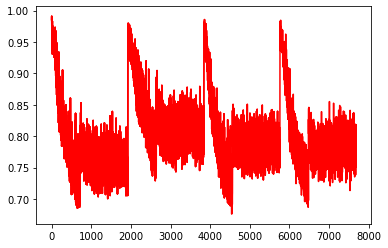

In [6]:
disco.diffuse(text_prompts, batch_name='hawkish', n_batches=4)

INFO:ekorpkit.models.disco.base:Using seed: 2321495138
INFO:ekorpkit.io.file:Processing [5] files from ['*.png']


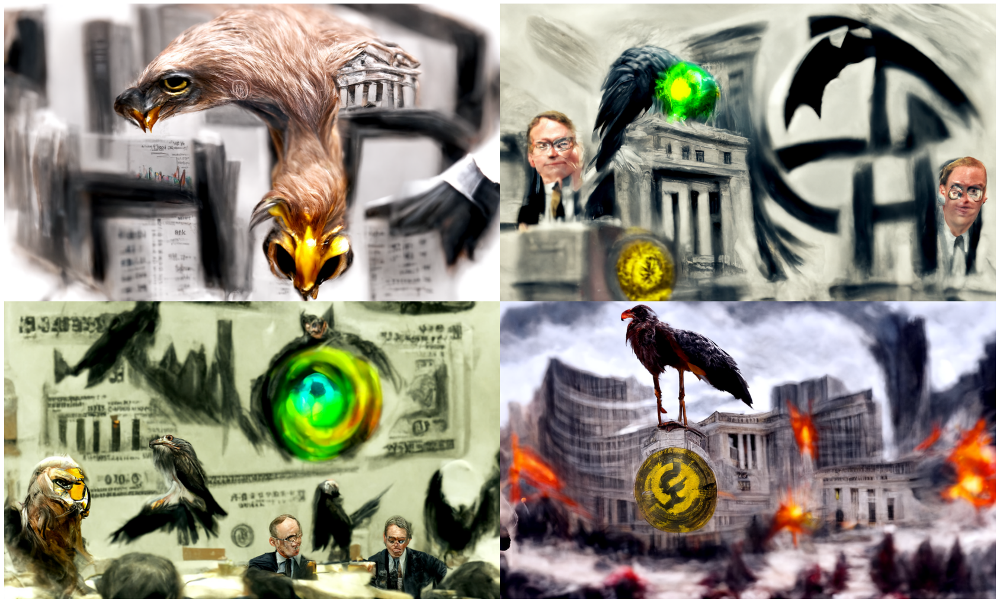

In [8]:
disco.collage(ncols=2, num_images=4)